**Circular Trajectory**

<ipython-input-12-c89e573f9940>:74: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  end_effector.set_data(x2, y2)


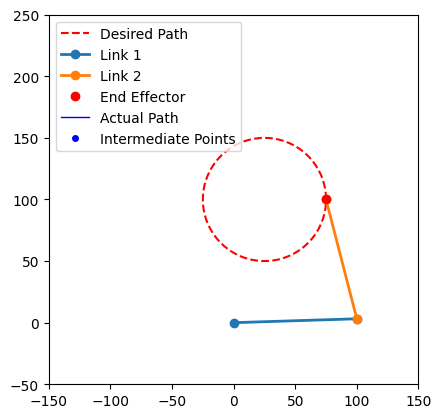

<ipython-input-12-c89e573f9940>:74: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  end_effector.set_data(x2, y2)


In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Define the parameters
L1 = 100  # Length of link 1
L2 = 100  # Length of link 2
center_x = -25 + 50  # x-coordinate of the center of the circle
center_y = 100  # y-coordinate of the center of the circle
radius = 50  # Radius of circle
num_frames = 100  # Number of frames in the animation

def deg(theta):
    return (np.pi / 180) * theta

def cos(q):
    return np.cos(deg(q))

def sin(q):
    return np.sin(deg(q))

def pos_x(l1, l2, q1, q2):
    return l1 * cos(q1) + l2 * cos(q2)

def pos_y(l1, l2, q1, q2):
    return l1 * sin(q1) + l2 * sin(q2)

def pos_x1(l1, q1):
    return l1 * cos(q1)

def pos_y1(l1, q1):
    return l1 * sin(q1)

def inverse_kinematics(x, y, l1, l2):
    theta = np.arccos((x**2 + y**2 - l1**2 - l2**2) / (2 * l1 * l2))
    theta1 = np.arctan2(y, x) - np.arctan2(l2 * np.sin(theta), l1 + l2 * np.cos(theta))
    theta2 = theta1 + theta
    return np.degrees(theta1), np.degrees(theta2)

# Create circular trajectory
theta_vals = np.linspace(0, 2 * np.pi, num_frames)
trajectory_x = center_x + radius * np.cos(theta_vals)
trajectory_y = center_y + radius * np.sin(theta_vals)

fig, ax = plt.subplots()
ax.set_xlim(-150, 150)
ax.set_ylim(-50, 250)
ax.set_aspect('equal')

ax.plot(trajectory_x, trajectory_y, 'r--', label='Desired Path')

# Initialize the lines for the links and end effector
line1, = ax.plot([], [], 'o-', lw=2, label='Link 1')
line2, = ax.plot([], [], 'o-', lw=2, label='Link 2')
end_effector, = ax.plot([], [], 'ro', label='End Effector')
actual_path, = ax.plot([], [], 'b-', lw=1, label='Actual Path')
scat1, = ax.plot([], [], 'bo', markersize=4, label='Intermediate Points')

actual_trajectory = np.zeros((num_frames, 2))

# Animation update function
def update(i):
    x_end = trajectory_x[i]
    y_end = trajectory_y[i]
    q1, q2 = inverse_kinematics(x_end, y_end, L1, L2)
    x1 = pos_x1(L1, q1)
    y1 = pos_y1(L1, q1)
    x2 = pos_x(L1, L2, q1, q2)
    y2 = pos_y(L1, L2, q1, q2)

    line1.set_data([0, x1], [0, y1])
    line2.set_data([x1, x2], [y1, y2])
    end_effector.set_data(x2, y2)

    # Storing actual trajectory
    actual_trajectory[i] = [x2, y2]
    actual_path.set_data(actual_trajectory[:i+1, 0], actual_trajectory[:i+1, 1])
    scat1.set_data(actual_trajectory[:i, 0], actual_trajectory[:i, 1])

    return line1, line2, end_effector, actual_path, scat1

ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=100, blit=True)
plt.legend()
plt.show()
HTML(ani.to_jshtml())


**Straight line Trajectory**

<ipython-input-13-73199274fbbc>:75: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  end_effector.set_data(x2, y2)


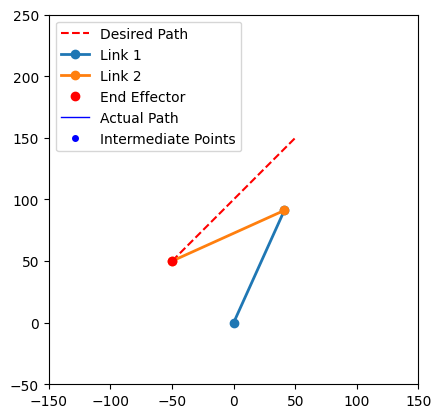

<ipython-input-13-73199274fbbc>:75: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  end_effector.set_data(x2, y2)


In [13]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Define the parameters
L1 = 100  # Length of link 1
L2 = 100  # Length of link 2
start_x = -50  # Starting x-coordinate of the line
start_y = 50  # Starting y-coordinate of the line
end_x = 50  # Ending x-coordinate of the line
end_y = 150  # Ending y-coordinate of the line
num_frames = 100  # Number of frames in the animation


def deg(theta):
    return (np.pi / 180) * theta

def cos(q):
    return np.cos(deg(q))

def sin(q):
    return np.sin(deg(q))

def pos_x(l1, l2, q1, q2):
    return l1 * cos(q1) + l2 * cos(q2)

def pos_y(l1, l2, q1, q2):
    return l1 * sin(q1) + l2 * sin(q2)

def pos_x1(l1, q1):
    return l1 * cos(q1)

def pos_y1(l1, q1):
    return l1 * sin(q1)

def inverse_kinematics(x, y, l1, l2):
    theta = np.arccos((x**2 + y**2 - l1**2 - l2**2) / (2 * l1 * l2))
    theta1 = np.arctan2(y, x) - np.arctan2(l2 * np.sin(theta), l1 + l2 * np.cos(theta))
    theta2 = theta1 + theta
    return np.degrees(theta1), np.degrees(theta2)

# Create straight line trajectory
trajectory_x = np.linspace(start_x, end_x, num_frames)
trajectory_y = np.linspace(start_y, end_y, num_frames)

fig, ax = plt.subplots()
ax.set_xlim(-150, 150)
ax.set_ylim(-50, 250)
ax.set_aspect('equal')

ax.plot(trajectory_x, trajectory_y, 'r--', label='Desired Path')

# Initialize the lines for the links and end effector
line1, = ax.plot([], [], 'o-', lw=2, label='Link 1')
line2, = ax.plot([], [], 'o-', lw=2, label='Link 2')
end_effector, = ax.plot([], [], 'ro', label='End Effector')
actual_path, = ax.plot([], [], 'b-', lw=1, label='Actual Path')
scat1, = ax.plot([], [], 'bo', markersize=4, label='Intermediate Points')

actual_trajectory = np.zeros((num_frames, 2))

# Animation update function
def update(i):
    x_end = trajectory_x[i]
    y_end = trajectory_y[i]
    q1, q2 = inverse_kinematics(x_end, y_end, L1, L2)
    x1 = pos_x1(L1, q1)
    y1 = pos_y1(L1, q1)
    x2 = pos_x(L1, L2, q1, q2)
    y2 = pos_y(L1, L2, q1, q2)

    line1.set_data([0, x1], [0, y1])
    line2.set_data([x1, x2], [y1, y2])
    end_effector.set_data(x2, y2)

    # Storing actual trajectory
    actual_trajectory[i] = [x2, y2]
    actual_path.set_data(actual_trajectory[:i+1, 0], actual_trajectory[:i+1, 1])
    scat1.set_data(actual_trajectory[:i, 0], actual_trajectory[:i, 1])

    return line1, line2, end_effector, actual_path, scat1


ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=100, blit=True)
plt.legend()
plt.show()
HTML(ani.to_jshtml())


**Triangular Trajectory**

<ipython-input-14-88fffc6af5d7>:78: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  end_effector.set_data(x2, y2)


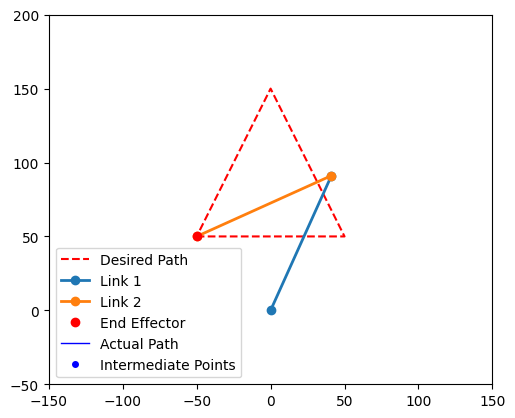

<ipython-input-14-88fffc6af5d7>:78: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  end_effector.set_data(x2, y2)


In [14]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Define the parameters
L1 = 100  # Length of link 1
L2 = 100  # Length of link 2
num_frames = 100  # Number of frames in the animation

def deg(theta):
    return (np.pi / 180) * theta

def cos(q):
    return np.cos(deg(q))

def sin(q):
    return np.sin(deg(q))

def pos_x(l1, l2, q1, q2):
    return l1 * cos(q1) + l2 * cos(q2)

def pos_y(l1, l2, q1, q2):
    return l1 * sin(q1) + l2 * sin(q2)

def pos_x1(l1, q1):
    return l1 * cos(q1)

def pos_y1(l1, q1):
    return l1 * sin(q1)

def inverse_kinematics(x, y, l1, l2):
    theta = np.arccos((x**2 + y**2 - l1**2 - l2**2) / (2 * l1 * l2))
    theta1 = np.arctan2(y, x) - np.arctan2(l2 * np.sin(theta), l1 + l2 * np.cos(theta))
    theta2 = theta1 + theta
    return np.degrees(theta1), np.degrees(theta2)

# Define the triangle vertices
vertices = np.array([
    [-50,  50],
    [ 50,  50],
    [  0, 150],
    [-50,  50]
])

# Create trajectory points by interpolating between the vertices
trajectory_x = np.interp(np.linspace(0, len(vertices)-1, num_frames), np.arange(len(vertices)), vertices[:,0])
trajectory_y = np.interp(np.linspace(0, len(vertices)-1, num_frames), np.arange(len(vertices)), vertices[:,1])

fig, ax = plt.subplots()
ax.set_xlim(-150, 150)
ax.set_ylim(-50, 200)
ax.set_aspect('equal')

ax.plot(vertices[:,0], vertices[:,1], 'r--', label='Desired Path')

# Initialize the lines for the links and end effector
line1, = ax.plot([], [], 'o-', lw=2, label='Link 1')
line2, = ax.plot([], [], 'o-', lw=2, label='Link 2')
end_effector, = ax.plot([], [], 'ro', label='End Effector')
actual_path, = ax.plot([], [], 'b-', lw=1, label='Actual Path')
scat1, = ax.plot([], [], 'bo', markersize=4, label='Intermediate Points')

actual_trajectory = np.zeros((num_frames, 2))

# Animation update function
def update(i):
    x_end = trajectory_x[i]
    y_end = trajectory_y[i]
    q1, q2 = inverse_kinematics(x_end, y_end, L1, L2)

    x1 = pos_x1(L1, q1)
    y1 = pos_y1(L1, q1)
    x2 = pos_x(L1, L2, q1, q2)
    y2 = pos_y(L1, L2, q1, q2)

    line1.set_data([0, x1], [0, y1])
    line2.set_data([x1, x2], [y1, y2])
    end_effector.set_data(x2, y2)

    # Storing actual trajectory
    actual_trajectory[i] = [x2, y2]
    actual_path.set_data(actual_trajectory[:i+1, 0], actual_trajectory[:i+1, 1])
    scat1.set_data(actual_trajectory[:i, 0], actual_trajectory[:i, 1])

    return line1, line2, end_effector, actual_path, scat1

ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=100, blit=True)
plt.legend()
plt.show()
HTML(ani.to_jshtml())
